In [2]:
pip install --upgrade pip

     ---------------------------------------- 1.8/1.8 MB 8.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 22.0.4
    Uninstalling pip-22.0.4:
      Successfully uninstalled pip-22.0.4
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px 
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as ss

from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import plotly.graph_objects as go
import os
for dirname, _, filenames in os.walk('C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\Countries GDP 1960-2020.csv
C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\countryContinent.csv
C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\life_expectancy_data.csv
C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\new
C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\Untitled.ipynb
C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\.ipynb_checkpoints\Untitled-checkpoint.ipynb


In [5]:
df = pd.read_csv("C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\life_expectancy_data.csv")
df["GdpPerCap"] = df.GDP / df.Population

df5 = pd.read_csv("C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\countryContinent.csv",encoding='ISO-8859-1')
df_to_merge = df5[["country","continent","sub_region","code_3"]]
df = pd.merge(left = df, right= df_to_merge, left_on = "Country",right_on= "country",how = "left").drop(columns =["country"])
df_gdp = pd.read_csv("C:/Users/surug/OneDrive/Desktop/Projects/GDP_Prediction\Countries GDP 1960-2020.csv",encoding='ISO-8859-1')

In [6]:
cols_to_extract = df_gdp.columns[-21:-5]
cols_to_extract = cols_to_extract.insert(0,["Country Name","Country Code"])
df_gdp = df_gdp[cols_to_extract]
df_gdp = pd.melt(frame = df_gdp,id_vars=["Country Name","Country Code"],value_vars = df_gdp.columns[2:],var_name = "Year",value_name = "GDP").sort_values(["Country Name","Year"])
df_gdp["GDP"] = df_gdp.GDP.apply(lambda x:"{:.2f}".format(x/1000000))
df_gdp["Year"] = df_gdp["Year"].astype("int64")
df.rename(columns={"code_3":"Country Code"},inplace = True)

In [7]:
#dff = pd.merge(left = df5, right = df_gdp, left_on = "country", right_on = "Country Name",how = "right").dropna(thresh = 5)
df = pd.merge(left = df, right = df_gdp, on = ["Country Code","Year"],how = "left").drop(columns = ["Country Name"]).rename(columns = {"GDP_y":"GDP"})

df.GDP = df.GDP.astype("float")
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,GdpPerCap,continent,sub_region,Country Code,GDP
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,33736494.0,17.2,17.3,0.479,10.1,0.000017,Asia,Southern Asia,AFG,NaN
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,327582.0,17.5,17.5,0.476,10.0,0.001870,Asia,Southern Asia,AFG,NaN
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,31731688.0,17.7,17.7,0.470,9.9,0.000020,Asia,Southern Asia,AFG,NaN
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,3696958.0,17.9,18.0,0.463,9.8,0.000181,Asia,Southern Asia,AFG,NaN
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,2978599.0,18.2,18.2,0.454,9.5,0.000021,Asia,Southern Asia,AFG,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,12777511.0,9.4,9.4,0.407,9.2,0.000036,Africa,Eastern Africa,ZWE,5805.60
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,12633897.0,9.8,9.9,0.418,9.5,0.000036,Africa,Eastern Africa,ZWE,5727.59
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,125525.0,1.2,1.3,0.427,10.0,0.000457,Africa,Eastern Africa,ZWE,6342.12
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,12366165.0,1.6,1.7,0.427,9.8,0.000044,Africa,Eastern Africa,ZWE,6777.38


In [8]:
def treat_incorrect_data(data_series):
    ma = data_series.rolling(min_periods=1, window=3).mean()
    deviation = data_series.rolling(min_periods=1, window=3).std()
    for i in range(len(data_series)):
        if data_series.iloc[i] < ma.iloc[i] - deviation.iloc[i] or data_series.iloc[i] > ma.iloc[i] + deviation.iloc[i]:
            if i > 0 and i < len(data_series) - 1:
                if not pd.isna(data_series.iloc[i - 1]) and not pd.isna(data_series.iloc[i + 1]):
                    data_series.iloc[i] = (data_series.iloc[i - 1] + data_series.iloc[i + 1]) / 2
                elif not pd.isna(data_series.iloc[i + 1]):
                    data_series.iloc[i] = (data_series.iloc[i + 1] + data_series.iloc[i + 2]) / 2
                elif not pd.isna(data_series.iloc[i - 1]):
                    data_series.iloc[i] = (data_series.iloc[i - 1] + data_series.iloc[i - 2]) / 2
    
    return data_series

In [64]:
df1 = df.copy()
columns_to_treat = df1.select_dtypes("float").columns
#for country in df1.Country.unique():
    #for column in columns_to_treat:
        #data_slice = df1[df1.Country==country].sort_values("Year")[column]
        #indices = data_slice.index
        #df1.loc[indices,column] = treat_incorrect_data(data_slice)
    

df2 = df1[df1['Income composition of resources'].isna()==False][::-1]

In [65]:
df2

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,GdpPerCap,continent,sub_region,Country Code,GDP
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.000000,79.0,1483,...,12222251.0,11.0,11.2,0.434,9.8,0.000045,Africa,Eastern Africa,ZWE,6689.96
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,12366165.0,1.6,1.7,0.427,9.8,0.000044,Africa,Eastern Africa,ZWE,6777.38
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,125525.0,1.2,1.3,0.427,10.0,0.000457,Africa,Eastern Africa,ZWE,6342.12
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,12633897.0,9.8,9.9,0.418,9.5,0.000036,Africa,Eastern Africa,ZWE,5727.59
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,12777511.0,9.4,9.4,0.407,9.2,0.000036,Africa,Eastern Africa,ZWE,5805.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,2978599.0,18.2,18.2,0.454,9.5,0.000021,Asia,Southern Asia,AFG,NaN
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,3696958.0,17.9,18.0,0.463,9.8,0.000181,Asia,Southern Asia,AFG,NaN
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,31731688.0,17.7,17.7,0.470,9.9,0.000020,Asia,Southern Asia,AFG,NaN
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,327582.0,17.5,17.5,0.476,10.0,0.001870,Asia,Southern Asia,AFG,NaN


In [26]:
df2.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Diphtheria,HIV/AIDS,GDP_x,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,GdpPerCap,GDP
count,2771.000000,2768.000000,2768.000000,2771.000000,2586.000000,2771.000000,2262.000000,2771.000000,2739.000000,2771.000000,...,2752.000000,2771.000000,2484.000000,2.285000e+03,2739.000000,2739.000000,2771.000000,2771.000000,2.263000e+03,1.281000e+03
mean,2007.505955,69.349566,163.041546,29.335619,4.520178,782.394998,80.962423,2192.957777,38.520884,40.612053,...,82.745276,1.758968,7497.937237,1.275896e+07,4.879555,4.918583,0.627551,12.001191,3.881757e-01,3.349370e+05
std,4.611657,9.360784,122.954439,120.194022,4.007690,2038.500799,24.944554,10549.883853,19.878627,163.419246,...,23.209260,5.185320,14284.017525,6.102487e+07,4.478094,4.569134,0.210904,3.345021,5.054979e+00,9.475866e+05
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.000000,0.000000,...,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,6.801655e-08,3.962600e+02
25%,2004.000000,63.500000,73.000000,0.000000,0.850000,9.837548,77.000000,0.000000,19.350000,0.000000,...,79.000000,0.100000,464.897355,1.965140e+05,1.600000,1.600000,0.493000,10.100000,1.258899e-04,7.428700e+03
50%,2008.000000,72.200000,143.500000,3.000000,3.695000,78.785649,92.000000,15.000000,44.000000,3.000000,...,93.000000,0.100000,1770.253970,1.388115e+06,3.300000,3.400000,0.677000,12.300000,1.267173e-03,2.713751e+04
75%,2012.000000,75.500000,225.000000,20.000000,7.505000,481.363676,97.000000,334.000000,56.100000,24.500000,...,97.000000,0.700000,5935.136533,7.423289e+06,7.200000,7.300000,0.779000,14.300000,1.222432e-02,2.360000e+05
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,83.300000,2500.000000,...,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000,1.882010e+02,1.110000e+07


In [63]:
df2.shape

(863, 22)

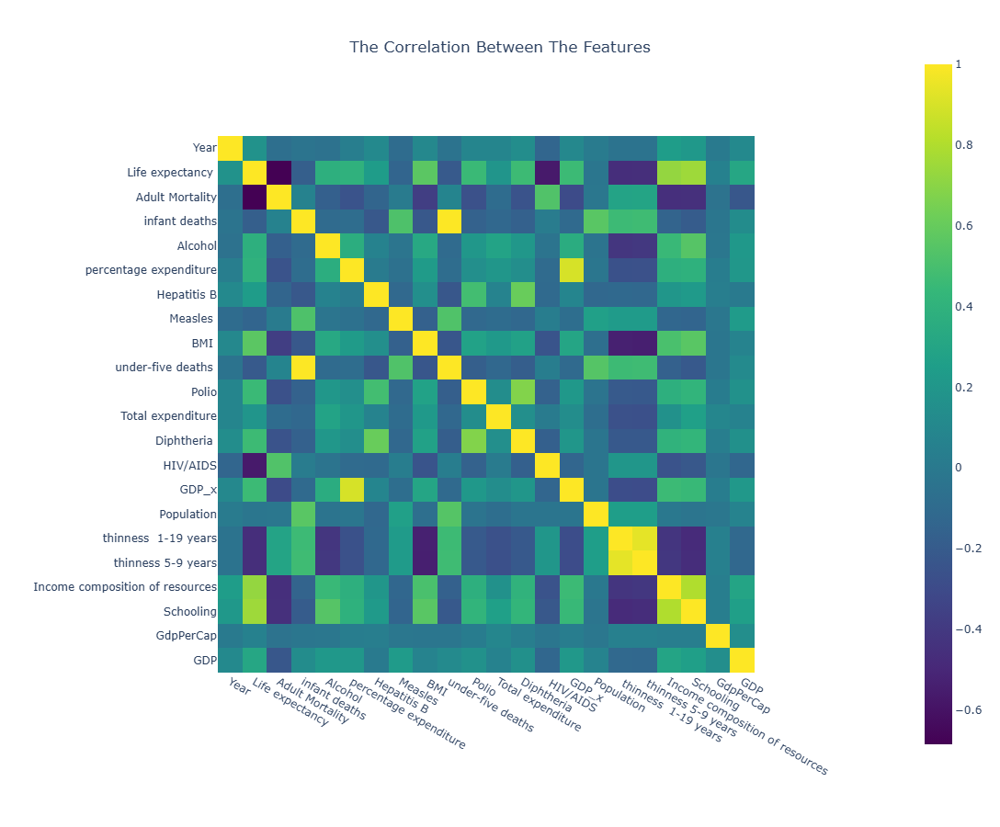

In [10]:
cor = df2.select_dtypes(include = ["float", "integer"]).corr()

fig = px.imshow(cor, x = cor.index ,y = cor.columns,color_continuous_scale = "viridis")
fig.update_layout(width = 900, height = 900)
fig.update_layout(title = "The Correlation Between The Features")
fig.update_layout(title={"x":0.5,
"y":0.95})

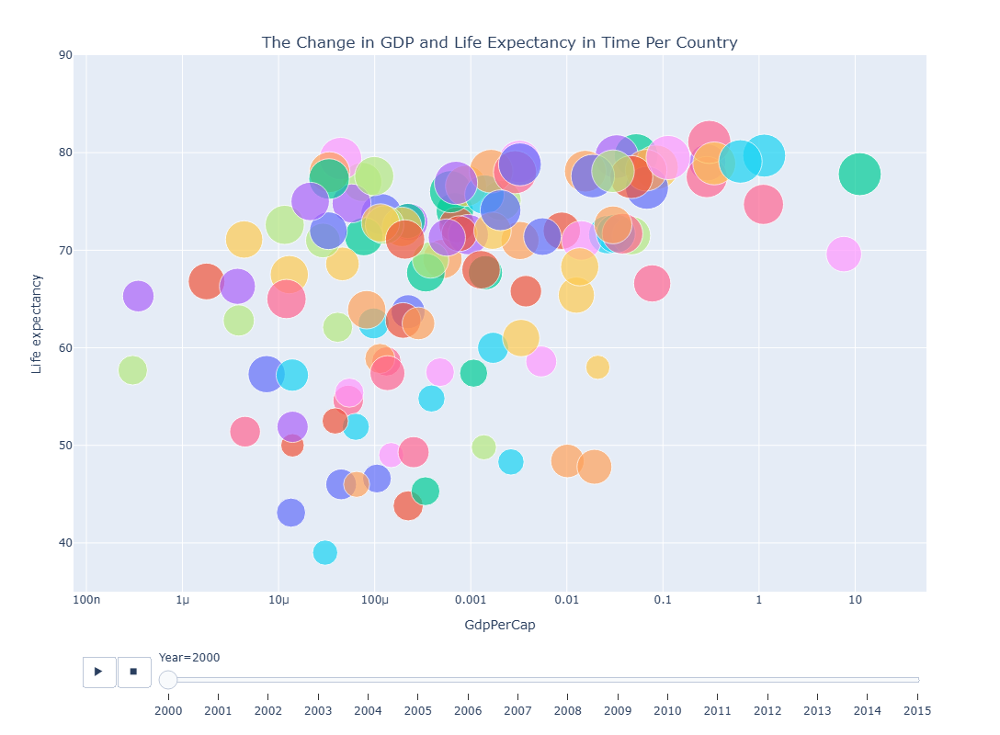

In [11]:
# Assuming df is your DataFrame
fig = px.scatter(
    df2,
    x="GdpPerCap",
    y=df2.columns[3],  # You may want to replace df.columns[3] with the appropriate column name
    animation_frame="Year",
    animation_group="Country",
    color="Country",
    hover_name="Country",
    log_x=True,
    size='Income composition of resources',  # Set size to 'Income composition of resources' column
    size_max=35,
    range_y=[35, 90],
    width=1500,
    height=800,
)
fig.update_traces(showlegend=False)
fig.update_layout(title = "The Change in GDP and Life Expectancy in Time Per Country")
fig.update_layout(title={"x":0.5,
"y":0.95})
fig.show()

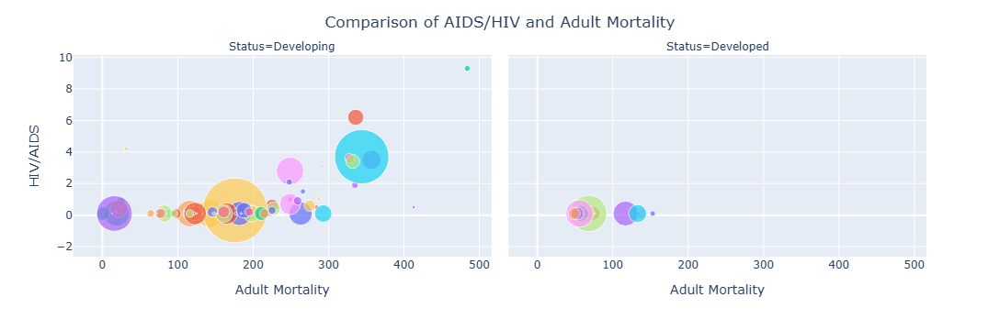

In [12]:
line_data = df[(df.Year==2015)&(df.Population.isna()==False)]

fig = px.scatter(line_data, x = "Adult Mortality", y= ' HIV/AIDS', color ="Country", facet_col="Status",size ="Population",size_max = 50)
fig.update_traces(showlegend = False)
fig.update_layout(title = "Comparison of AIDS/HIV and Adult Mortality")
fig.update_layout(title={"x":0.5,
"y":0.95})

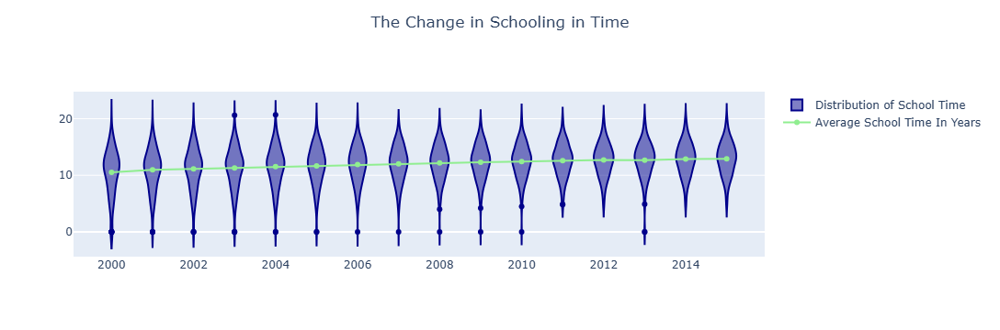

In [14]:
violin_data = df[df.Schooling.isna()==False]
violin_means = violin_data.groupby("Year")["Schooling"].mean().reset_index()
fig = go.Figure()
fig.add_trace(go.Violin(x = violin_data.Year, y =violin_data.Schooling, name= "Distribution of School Time ",marker = dict(color="darkblue")))
fig.add_trace(go.Scatter(x = violin_means.Year, y = violin_means.Schooling, mode = "markers+lines", name = "Average School Time In Years",line=dict(color= "lightgreen")))
fig.update_layout(title = "The Change in Schooling in Time")
fig.update_layout(title={"x":0.5,
"y":0.95})

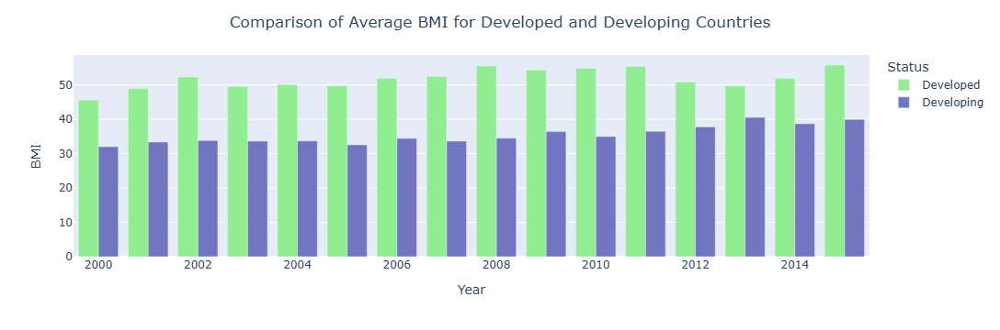

In [15]:
bar_data = df[df[' BMI '].isna()==False]
bar_data = bar_data.groupby(["Year", "Status"])[" BMI "].mean().reset_index()

color_mapping = {
    'Developing': '#7276c0',
    'Developed': 'lightgreen'
}
fig = px.bar(bar_data , x = "Year", y = ' BMI ', color = "Status",barmode = "group",color_discrete_map = color_mapping)
fig.update_layout(title = "Comparison of Average BMI for Developed and Developing Countries")
fig.update_layout(title={"x":0.5,
"y":0.95})

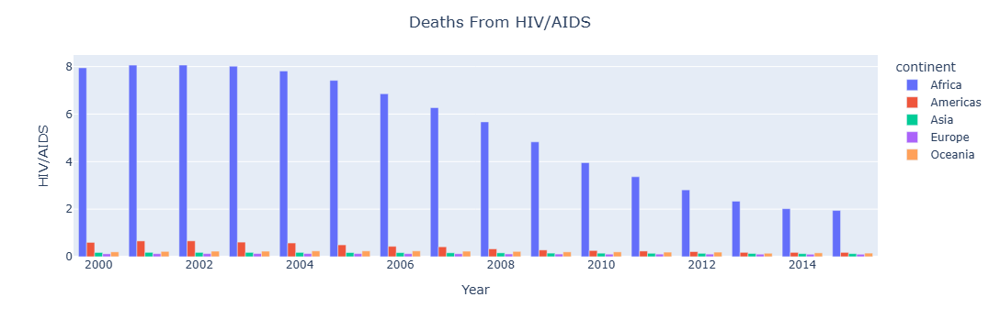

In [13]:
aids_data = df.groupby(["Year","continent"])[' HIV/AIDS'].mean().reset_index()
fig = px.bar(aids_data,x = "Year",y =" HIV/AIDS", color = "continent",barmode = "group")
fig.update_layout(title = "Deaths From HIV/AIDS")
fig.update_layout(title={"x":0.5,
"y":0.95})

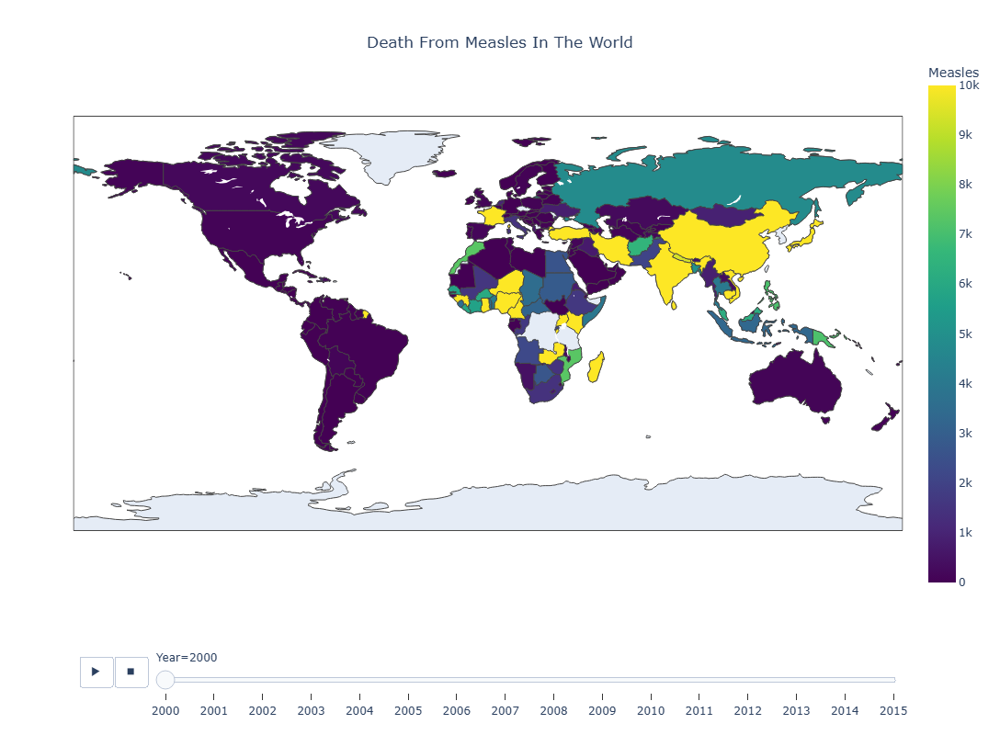

In [16]:
fig = px.choropleth(df[::-1], locations = "Country Code",
                    hover_name = "Country",color = 'Measles ',
                    animation_frame = "Year",animation_group = 'Measles ',
                    width = 1400, height = 800,
                    color_continuous_scale=px.colors.sequential.Viridis,
                    range_color = [0,10000])
fig.update_layout(
    title_text = "Death From Measles In The World"
)
fig.update_layout(title={"x":0.5,
"y":0.95})

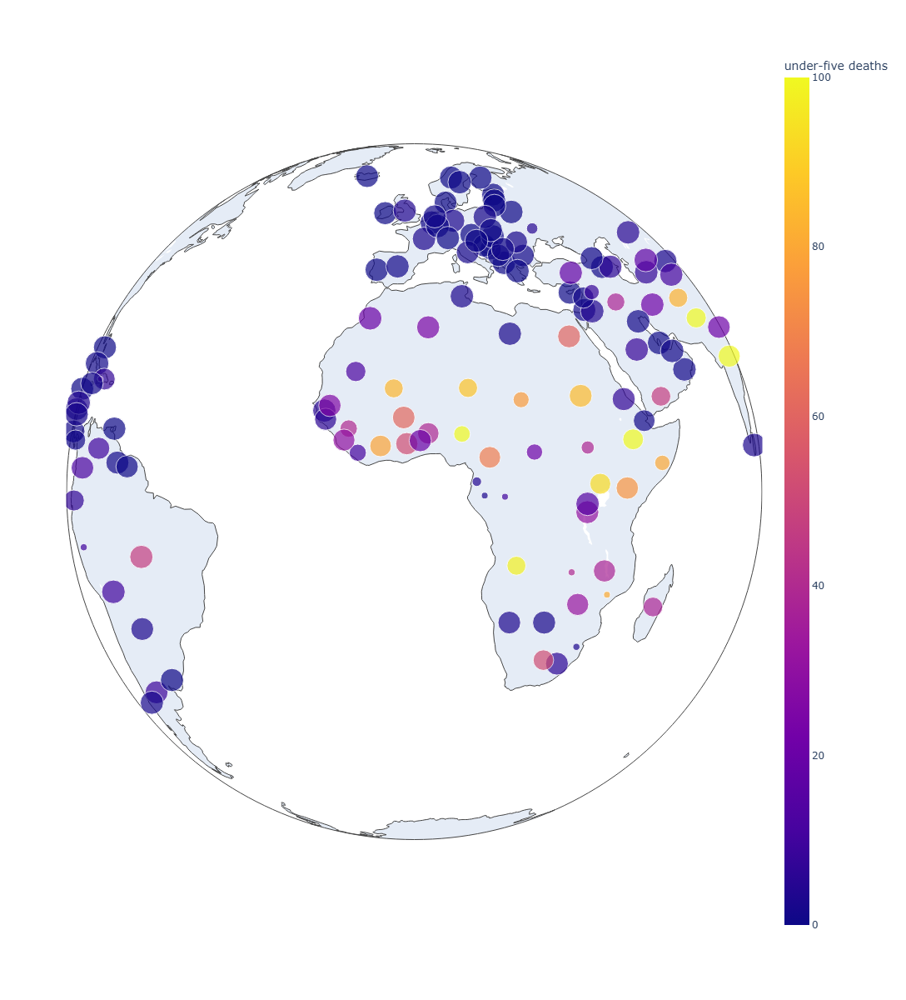

In [17]:
geo_data = df[(df['Diphtheria '].isna()==False) & (df["Year"]==2015)]
px.scatter_geo(geo_data,locations = "Country Code",\
               color = 'under-five deaths ', size = 'Diphtheria ',
               projection = "orthographic",width = 1200, height = 1200,range_color = [0,100])

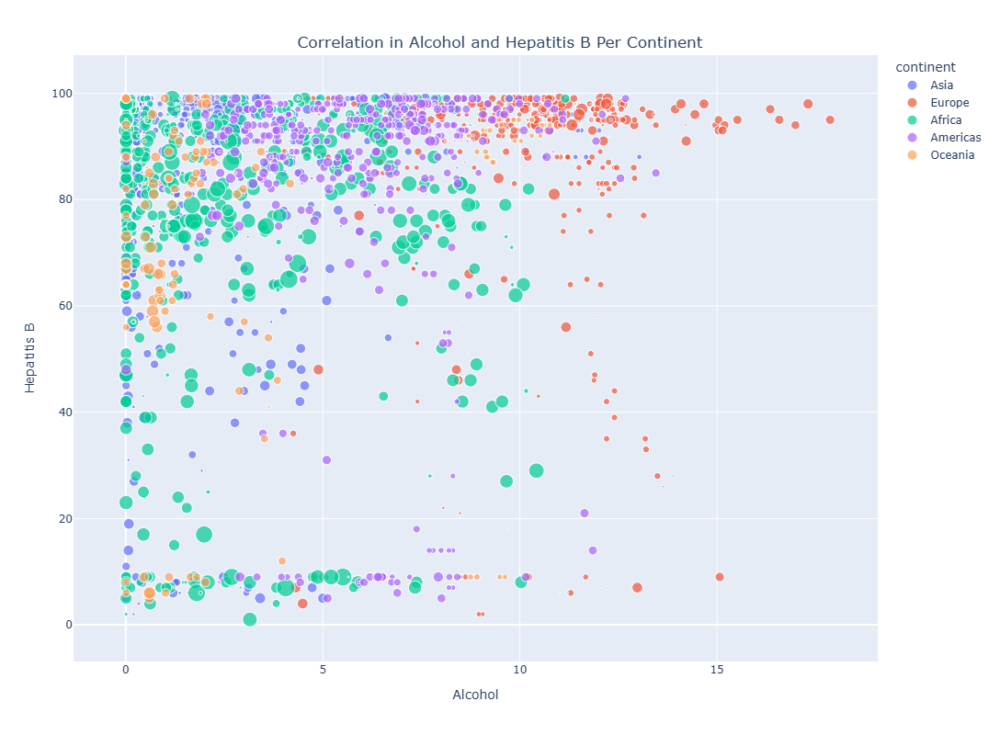

In [18]:
hepatitis_data = df[df["Adult Mortality"].isna()==False]
fig = px.scatter(hepatitis_data,x = "Alcohol", y = "Hepatitis B",size = "Adult Mortality",
           color = "continent",width = 1500, height = 800, hover_data = "Country")
fig.update_layout(title = "Correlation in Alcohol and Hepatitis B Per Continent")
fig.update_layout(title={"x":0.5,
"y":0.95})

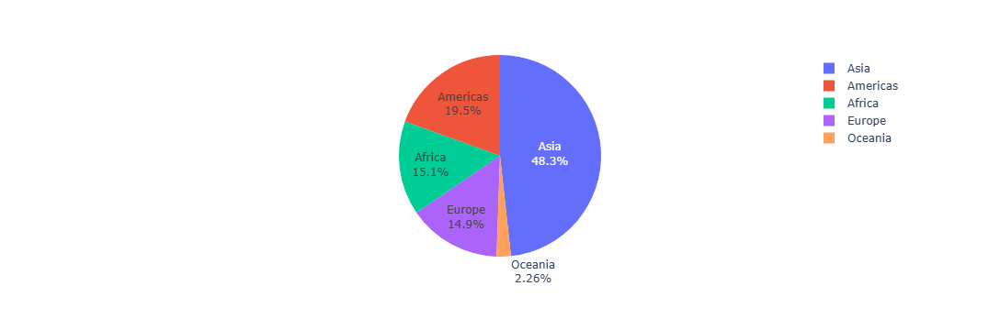

In [19]:
pop_data = df.groupby(['continent',"Year"])["Population"].mean().reset_index()

fig = px.pie(pop_data,names = "continent",values="Population")
fig.update_traces(textinfo='label+percent')
fig


In [20]:
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,GdpPerCap,continent,sub_region,Country Code,GDP
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,33736494.0,17.2,17.3,0.479,10.1,0.000017,Asia,Southern Asia,AFG,NaN
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,327582.0,17.5,17.5,0.476,10.0,0.001870,Asia,Southern Asia,AFG,NaN
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,31731688.0,17.7,17.7,0.470,9.9,0.000020,Asia,Southern Asia,AFG,NaN
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,3696958.0,17.9,18.0,0.463,9.8,0.000181,Asia,Southern Asia,AFG,NaN
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,2978599.0,18.2,18.2,0.454,9.5,0.000021,Asia,Southern Asia,AFG,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,12777511.0,9.4,9.4,0.407,9.2,0.000036,Africa,Eastern Africa,ZWE,5805.60
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,12633897.0,9.8,9.9,0.418,9.5,0.000036,Africa,Eastern Africa,ZWE,5727.59
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,125525.0,1.2,1.3,0.427,10.0,0.000457,Africa,Eastern Africa,ZWE,6342.12
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,12366165.0,1.6,1.7,0.427,9.8,0.000044,Africa,Eastern Africa,ZWE,6777.38


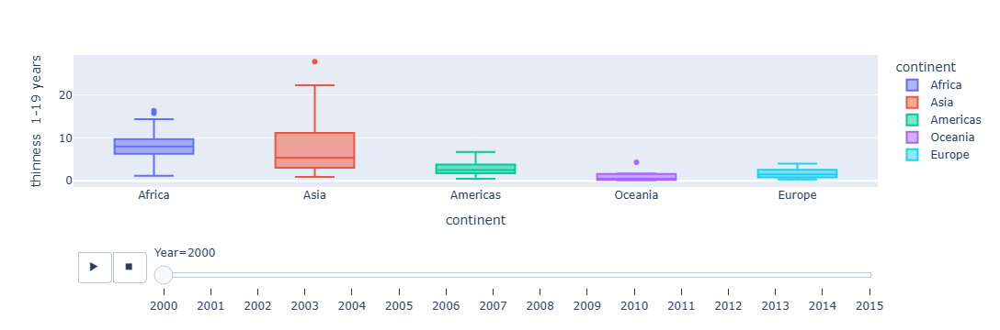

In [21]:
thinness_data = df[(df[" thinness  1-19 years"].isna()==False)]
px.box(thinness_data[::-1], x ="continent", y = ' thinness  1-19 years',
      color = "continent",animation_frame = "Year")

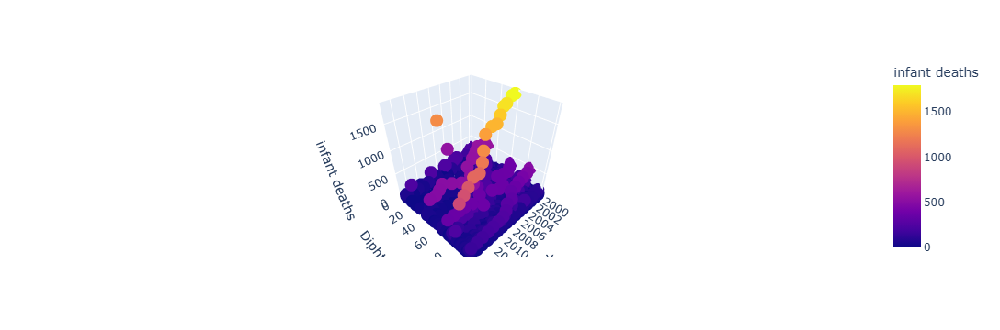

In [22]:
diphteria_data = df[df['Diphtheria '].isna()==False]
px.scatter_3d(diphteria_data,y = 'Diphtheria ', x = 'Year',
              z ="infant deaths",color = "infant deaths",hover_data = "Country")

In [23]:
df_grouped = df.groupby("Status").agg({"GDP":"mean", "Year":"count","Population":"mean"})
df_grouped["GPD Per Pop"] = df_grouped["GDP"] / df_grouped["Population"]
df_grouped = df_grouped.reset_index()
df_grouped

,Status,GDP,Year,Population,GPD Per Pop
0,Developed,1.785517e+06,512,6.830053e+06,0.261421
1,Developing,2.214162e+05,2426,1.407108e+07,0.015736


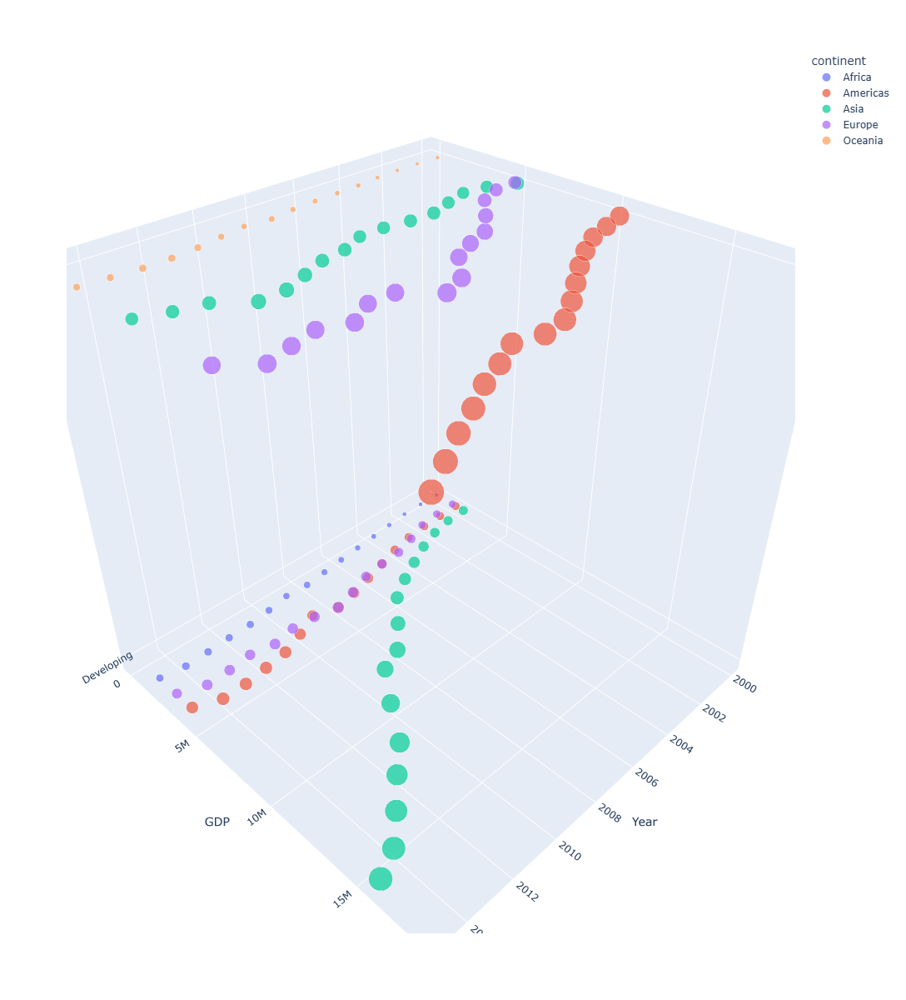

In [24]:
GDP_data = df[df.GDP.isna()==False][::-1]
GDP_data = GDP_data.groupby(["Year","continent", "Status"])["GDP"].sum().reset_index()
px.scatter_3d(GDP_data, x = "Year", y = "GDP", z = "Status", color = "continent", 
              size = "GDP",width = 1200, height = 1200, size_max = 50)

In [90]:
df2 = df2.drop(['Country', 'Status','continent', 'sub_region', 'Country Code'], axis=1)

In [91]:
df2.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Diphtheria,HIV/AIDS,GDP_x,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,GdpPerCap,GDP
count,2771.000000,2768.000000,2768.000000,2771.000000,2586.000000,2771.000000,2262.000000,2771.000000,2739.000000,2771.000000,...,2752.000000,2771.000000,2484.000000,2.285000e+03,2739.000000,2739.000000,2771.000000,2771.000000,2.263000e+03,1.281000e+03
mean,2007.505955,69.349566,163.041546,29.335619,4.520178,782.394998,80.962423,2192.957777,38.520884,40.612053,...,82.745276,1.758968,7497.937237,1.275896e+07,4.879555,4.918583,0.627551,12.001191,3.881757e-01,3.349370e+05
std,4.611657,9.360784,122.954439,120.194022,4.007690,2038.500799,24.944554,10549.883853,19.878627,163.419246,...,23.209260,5.185320,14284.017525,6.102487e+07,4.478094,4.569134,0.210904,3.345021,5.054979e+00,9.475866e+05
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.000000,0.000000,...,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,6.801655e-08,3.962600e+02
25%,2004.000000,63.500000,73.000000,0.000000,0.850000,9.837548,77.000000,0.000000,19.350000,0.000000,...,79.000000,0.100000,464.897355,1.965140e+05,1.600000,1.600000,0.493000,10.100000,1.258899e-04,7.428700e+03
50%,2008.000000,72.200000,143.500000,3.000000,3.695000,78.785649,92.000000,15.000000,44.000000,3.000000,...,93.000000,0.100000,1770.253970,1.388115e+06,3.300000,3.400000,0.677000,12.300000,1.267173e-03,2.713751e+04
75%,2012.000000,75.500000,225.000000,20.000000,7.505000,481.363676,97.000000,334.000000,56.100000,24.500000,...,97.000000,0.700000,5935.136533,7.423289e+06,7.200000,7.300000,0.779000,14.300000,1.222432e-02,2.360000e+05
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,83.300000,2500.000000,...,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000,1.882010e+02,1.110000e+07


In [92]:
df2 = df2.dropna()
df2

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Diphtheria,HIV/AIDS,GDP_x,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,GdpPerCap,GDP
2937,2000,46.0,665.0,24,1.68,0.000000,79.0,1483,25.5,39,...,78.0,43.5,547.358878,12222251.0,11.0,11.2,0.434,9.8,0.000045,6689.96
2936,2001,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,...,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8,0.000044,6777.38
2935,2002,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,...,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0,0.000457,6342.12
2934,2003,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,...,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5,0.000036,5727.59
2933,2004,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,...,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2,0.000036,5805.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37,2010,74.7,119.0,21,0.45,430.717586,95.0,103,53.9,24,...,95.0,0.1,4463.394675,36117637.0,5.9,5.8,0.714,13.6,0.000124,161000.00
36,2011,74.9,116.0,21,0.56,509.002041,95.0,112,55.0,24,...,95.0,0.1,5432.252300,36819558.0,5.9,5.8,0.724,14.0,0.000148,200000.00
35,2012,75.1,113.0,21,0.66,555.926083,95.0,18,56.1,24,...,95.0,0.1,5564.825660,37565847.0,5.9,5.8,0.732,14.4,0.000148,209000.00
34,2013,75.3,112.0,21,0.53,544.450743,95.0,25,57.2,24,...,95.0,0.1,5471.866766,38338562.0,5.9,5.8,0.737,14.4,0.000143,210000.00


In [118]:
print(df2.columns)


Index(['Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP_x', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling',
       'GdpPerCap', 'GDP'],
      dtype='object')


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [134]:
# Load your dataset
# df = pd.read_csv('your_data.csv') # Replace with the path to your dataset if it's a CSV file

# Select the features (independent variables) and the target variable (dependent variable)
# Assuming 'Life expectancy' is the target variable and the rest are features
X = df2.drop(columns=['Year', 'Life expectancy '])  # Use the correct column name  # Drop target and non-feature columns
y = df2['Life expectancy ']

# Handle missing values (if any) - here we drop rows with missing values
# You could also impute missing values using mean/median if necessary
df2 = df2.dropna()

In [135]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [136]:
# Normalize the data (Standard Scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [138]:
# Initialize the linear regression model
model = LinearRegression()

In [140]:
# Train the model
model.fit(X_train_scaled, y_train)

LinearRegression()

In [141]:
# Predict the target values for training and testing data
y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)

In [142]:
# Evaluation metrics
def regression_metrics(y_true, y_pred):
    RMSE = mean_squared_error(y_true, y_pred, squared=False)
    MSE = mean_squared_error(y_true, y_pred, squared=True)
    MAE = mean_absolute_error(y_true, y_pred)
    R2 = r2_score(y_true, y_pred)
    return RMSE, MSE, MAE, R2

# Evaluate on training and testing data
print("Training Data Metrics:")
RMSE_train, MSE_train, MAE_train, R2_train = regression_metrics(y_train, y_pred_train)
print(f"RMSE: {RMSE_train}, MSE: {MSE_train}, MAE: {MAE_train}, R2: {R2_train}")

print("\nTesting Data Metrics:")
RMSE_test, MSE_test, MAE_test, R2_test = regression_metrics(y_test, y_pred_test)
print(f"RMSE: {RMSE_test}, MSE: {MSE_test}, MAE: {MAE_test}, R2: {R2_test}")

Training Data Metrics:
RMSE: 3.159500004294278, MSE: 9.982440277135542, MAE: 2.267479910657934, R2: 0.907477745609219

Testing Data Metrics:
RMSE: 3.0944147319683406, MSE: 9.575402533422698, MAE: 2.338092490033693, R2: 0.9052289031551837


C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and wi

In [143]:
# Assuming you already have the predictions 'y_pred_sgd' for training and 'y_pred_sgd_test' for testing

# For training data
df_train_pred = pd.DataFrame({
    'y_actual': y_train,  # Actual values for the training set
    'y_predicted_sgd': np.round(y_pred_sgd, 1)  # Predicted values for the training set
})

In [144]:
# For testing data
df_test_pred = pd.DataFrame({
    'y_actual': y_test,  # Actual values for the testing set
    'y_predicted_sgd': np.round(y_pred_sgd_test, 1)  # Predicted values for the testing set
})

In [145]:
# Display the comparison for the training data
print("\nTraining Data Predictions:")
print(df_train_pred.head())  # First 5 rows

# Display the comparison for the testing data
print("\nTesting Data Predictions:")
print(df_test_pred.head())  # First 5 rows


Training Data Predictions:
      y_actual  y_predicted_sgd
2286      72.4     1.804351e+12
2429      82.1     1.393549e+12
1878      61.4    -8.945904e+11
2571      74.5     8.043973e+11
1696      75.0     1.006258e+12

Testing Data Predictions:
      y_actual  y_predicted_sgd
504       85.0    -2.471657e+11
907       68.5     1.230081e+12
2491      57.6    -1.134886e+12
2164      57.0    -2.480609e+12
1684      76.6     1.487953e+12


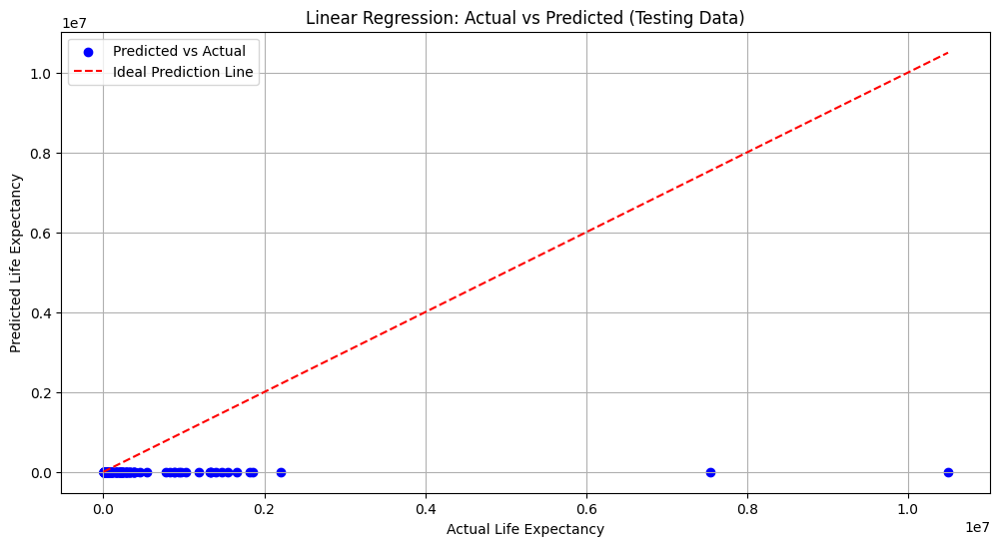

In [163]:
# Plot actual vs predicted for the testing data
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_test, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Prediction Line')
plt.title('Linear Regression: Actual vs Predicted (Testing Data)')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.legend()
plt.grid(True)
plt.show()

In [147]:
df2 = df2.dropna()

In [148]:
# Step 1: Prepare the data
X = df2.iloc[:, :-1].values  # All columns except the last (target column)
y = df2.iloc[:, -1].values   # Last column is the target ('Life expectancy')


In [149]:
# Step 2: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [150]:
# Step 3: Normalize the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Importing necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [151]:
# Train Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

In [152]:
# Fit the model to the training data
rf_model.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=42)

In [153]:
# Predict the target values for training and testing data
y_pred_train_rf = rf_model.predict(X_train_scaled)
y_pred_test_rf = rf_model.predict(X_test_scaled)


In [154]:
# Evaluation metrics function
def regression_metrics(y_true, y_pred):
    RMSE = mean_squared_error(y_true, y_pred, squared=False)
    MSE = mean_squared_error(y_true, y_pred, squared=True)
    MAE = mean_absolute_error(y_true, y_pred)
    R2 = r2_score(y_true, y_pred)
    return RMSE, MSE, MAE, R2

In [155]:
# Evaluate on training and testing data
print("Training Data Metrics (Random Forest):")
RMSE_train_rf, MSE_train_rf, MAE_train_rf, R2_train_rf = regression_metrics(y_train, y_pred_train_rf)
print(f"RMSE: {RMSE_train_rf}, MSE: {MSE_train_rf}, MAE: {MAE_train_rf}, R2: {R2_train_rf}")

print("\nTesting Data Metrics (Random Forest):")
RMSE_test_rf, MSE_test_rf, MAE_test_rf, R2_test_rf = regression_metrics(y_test, y_pred_test_rf)
print(f"RMSE: {RMSE_test_rf}, MSE: {MSE_test_rf}, MAE: {MAE_test_rf}, R2: {R2_test_rf}")


Training Data Metrics (Random Forest):
RMSE: 176307.4221731284, MSE: 31084307113.33373, MAE: 32511.862479855066, R2: 0.9517465400675885

Testing Data Metrics (Random Forest):
RMSE: 540115.1505615388, MSE: 291724375866.11365, MAE: 115209.66428843934, R2: 0.7291843002549516


C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\surug\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and wi

In [156]:
# Optional: Create DataFrames to compare actual vs predicted values for both training and testing data
df_train_pred_rf = pd.DataFrame({'y_actual': y_train, 'y_predicted': y_pred_train_rf})
df_test_pred_rf = pd.DataFrame({'y_actual': y_test, 'y_predicted': y_pred_test_rf})

# Display the comparison
print("\nTraining Data Predictions (Random Forest):")
print(df_train_pred_rf.head())  # First 5 rows

print("\nTesting Data Predictions (Random Forest):")
print(df_test_pred_rf.head())  # First 5 rows


Training Data Predictions (Random Forest):
     y_actual   y_predicted
0      969.94  3.513810e+03
1  1480000.00  1.490600e+06
2    10862.94  1.115349e+04
3   420000.00  3.758437e+05
4   772000.00  7.350925e+05

Testing Data Predictions (Random Forest):
     y_actual   y_predicted
0  1470000.00  1.526830e+06
1     3076.31  5.927353e+04
2     4597.53  1.661928e+04
3     1964.78  6.425075e+03
4  1320000.00  1.040937e+06


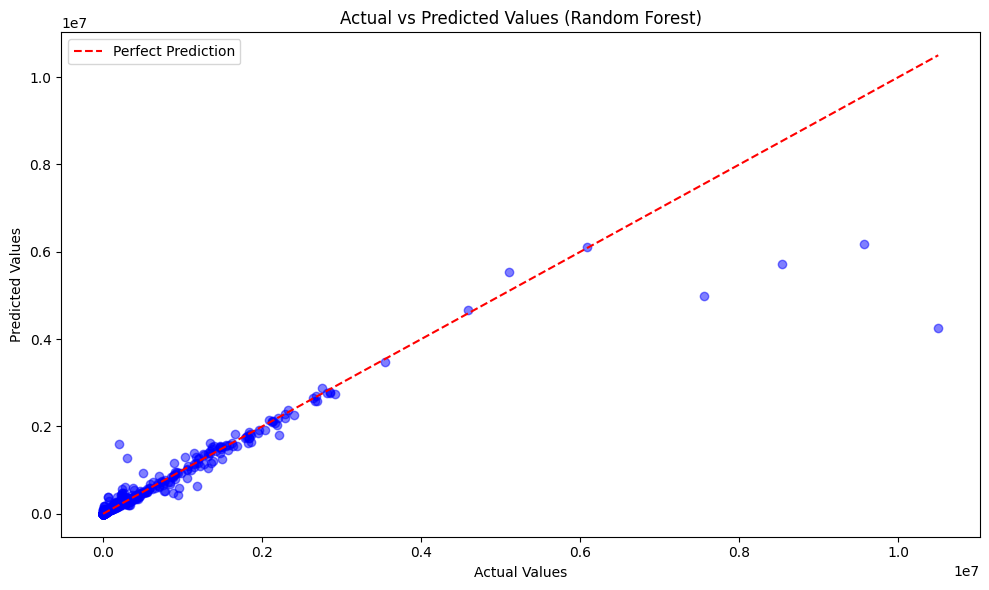

In [162]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert numpy arrays to pandas Series
y_train_series = pd.Series(y_train)
y_test_series = pd.Series(y_test)
y_pred_train_rf_series = pd.Series(y_pred_train_rf)
y_pred_test_rf_series = pd.Series(y_pred_test_rf)

# Combine actual and predicted values into one DataFrame (both training and testing data)
df_combined = pd.DataFrame({
    'Actual': pd.concat([y_train_series, y_test_series]),
    'Predicted': pd.concat([y_pred_train_rf_series, y_pred_test_rf_series])
})

# Create a scatter plot of actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(df_combined['Actual'], df_combined['Predicted'], color='blue', alpha=0.5)

# Plot a line for perfect prediction (diagonal line)
plt.plot([min(df_combined['Actual']), max(df_combined['Actual'])],
         [min(df_combined['Actual']), max(df_combined['Actual'])],
         color='red', linestyle='--', label='Perfect Prediction')

# Adding title and labels
plt.title('Actual vs Predicted Values (Random Forest)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Display the plot
plt.tight_layout()
plt.legend()
plt.show()
